# **Bibliotecas e Leitura dos dados**

In [ ]:
# !pip install pandas
# !pip install numpy
# !pip install matplotlib.pyplot
# !pip install seaborn
# !pip install plotly
# !pip install scipy
# !pip install scikit-learn

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff

from sklearn.preprocessing import MinMaxScaler

In [ ]:
# Configuração geral dos gráficos
sns.set(style="whitegrid")

# Configuração geral dos gráficos
sns.set(style="whitegrid")

In [ ]:
df = pd.read_csv('sample.csv')

In [ ]:
df.head()

,loja_id,produto_id,categoria_id,is_medicamento,curva,data,estoque,venda,custo,preco
0,2,5124,2,False,E,2024-11-12,0,0.0,0.111198,0.171087
1,2,208,2,False,D,2023-08-13,3,0.0,0.069276,0.134420
2,7,208,2,False,D,2022-06-14,2,0.0,0.069276,0.124337
3,10,5124,2,False,E,2022-09-01,1,0.0,0.111198,0.171087
4,4,5124,2,False,E,2024-10-11,0,0.0,0.111198,0.171087


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41389576 entries, 0 to 41389575
Data columns (total 10 columns):
 #   Column          Dtype  
---  ------          -----  
 0   loja_id         int64  
 1   produto_id      int64  
 2   categoria_id    int64  
 3   is_medicamento  bool   
 4   curva           object 
 5   data            object 
 6   estoque         int64  
 7   venda           float64
 8   custo           float64
 9   preco           float64
dtypes: bool(1), float64(3), int64(4), object(2)
memory usage: 2.8+ GB


In [ ]:
df["loja_id"].value_counts()

loja_id
5     4417596
7     4415266
10    4290584
2     4268601
9     4260927
8     4138478
4     4127029
6     4109636
1     3989414
3     3372045
Name: count, dtype: int64

In [ ]:
df["categoria_id"].value_counts()

categoria_id
3     13752527
4     11971563
9      6100970
5      2396408
7      2290901
6      1908109
8      1518076
1       647533
11      525980
10      223248
2        54261
Name: count, dtype: int64

In [ ]:
df['produto_id'].value_counts()

produto_id
140     11480
3602    11480
3113    11480
2165    11480
208     11480
        ...  
2162       12
2085       10
4868        1
1430        1
2528        1
Name: count, Length: 5290, dtype: int64

In [ ]:
# Verificar se há valores ausentes nas colunas 'estoque' e 'venda'
print(df[['estoque', 'venda']].isnull().sum())


estoque    0
venda      0
dtype: int64


# **Gráficos**

## Histogramas

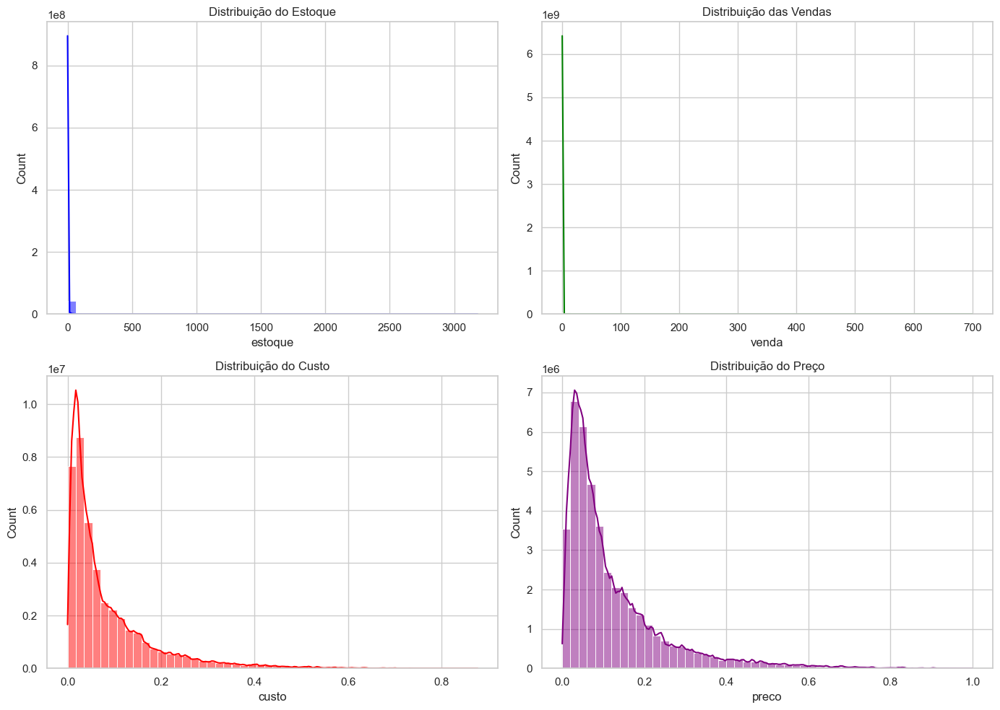

In [ ]:
# Histogramas de estoque, venda, custo e preço
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

sns.histplot(df["estoque"], bins=50, ax=axes[0, 0], kde=True, color="blue")
axes[0, 0].set_title("Distribuição do Estoque")

sns.histplot(df["venda"], bins=50, ax=axes[0, 1], kde=True, color="green")
axes[0, 1].set_title("Distribuição das Vendas")

sns.histplot(df["custo"], bins=50, ax=axes[1, 0], kde=True, color="red")
axes[1, 0].set_title("Distribuição do Custo")

sns.histplot(df["preco"], bins=50, ax=axes[1, 1], kde=True, color="purple")
axes[1, 1].set_title("Distribuição do Preço")

plt.tight_layout()
plt.show()

## Boxplots

### Comparação das vendas por "Curva"

C:\Users\Rafae\AppData\Local\Temp\ipykernel_5876\932304895.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="curva", y="venda", data=df, palette="Set2")


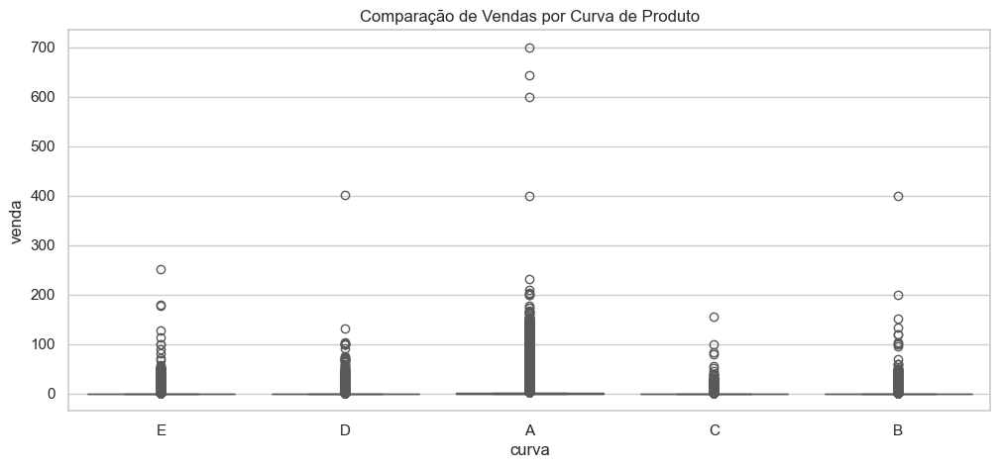

In [ ]:
# Figura 4: Comparação de Vendas por Categoria
plt.figure(figsize=(12, 5))
sns.boxplot(x="curva", y="venda", data=df, palette="Set2")
plt.title("Comparação de Vendas por Curva de Produto")
plt.show()

### Comparação das vendas por "Medicamento"

C:\Users\Rafae\AppData\Local\Temp\ipykernel_5876\462519807.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="is_medicamento", y="venda", data=df, palette="coolwarm")


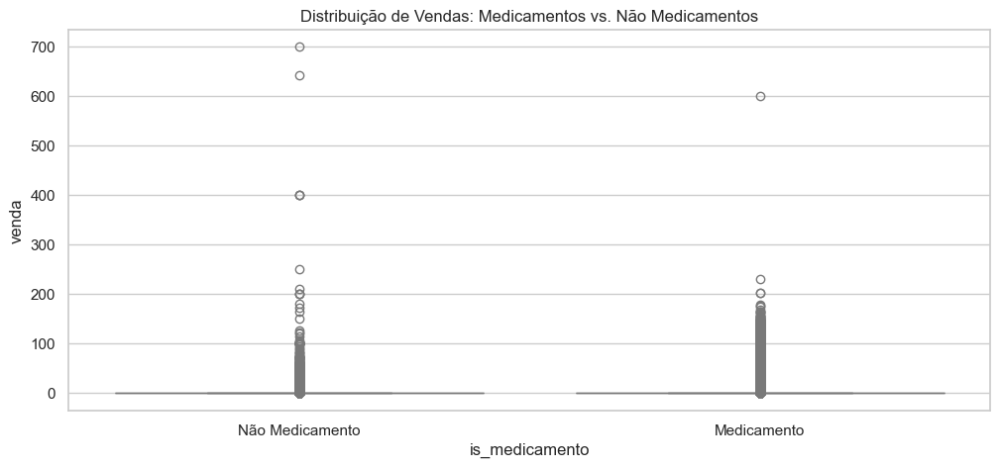

In [ ]:
# Figura 5: Comparação de Medicamentos vs. Não Medicamentos
plt.figure(figsize=(12, 5))
sns.boxplot(x="is_medicamento", y="venda", data=df, palette="coolwarm")
plt.xticks([0, 1], ["Não Medicamento", "Medicamento"])
plt.title("Distribuição de Vendas: Medicamentos vs. Não Medicamentos")
plt.show()

## Matriz de Correlação entre as principais medidas

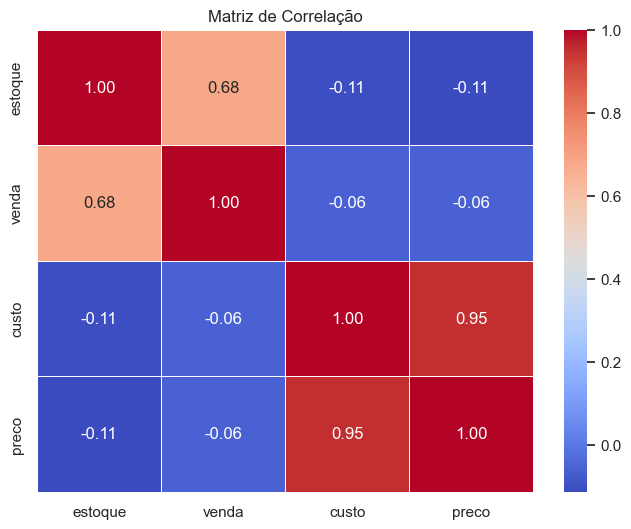

In [ ]:
# Figura 2: Matriz de Correlação
plt.figure(figsize=(8, 6))
correlation = df[["estoque", "venda", "custo", "preco"]].corr()
sns.heatmap(correlation, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Matriz de Correlação")
plt.show()

## Vendas e Estoque

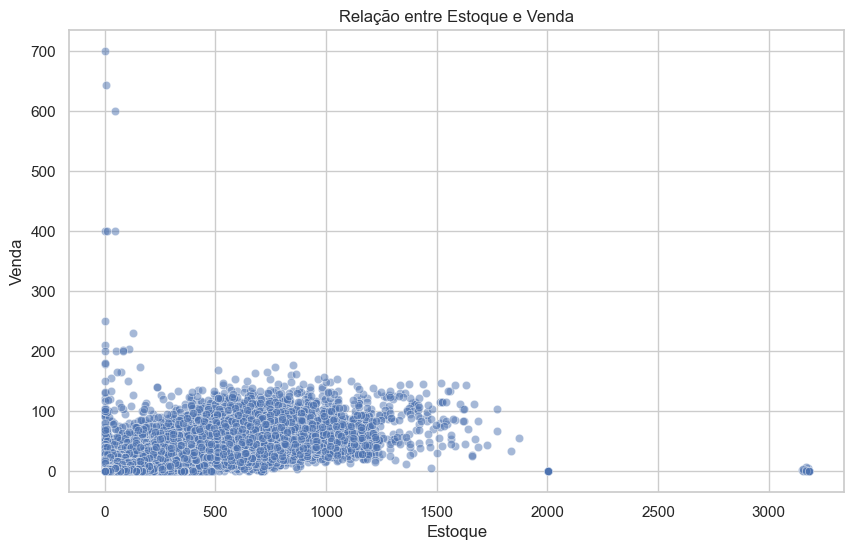

In [ ]:
# Scatter plot de estoque vs. venda
plt.figure(figsize=(10, 6))
sns.scatterplot(x='estoque', y='venda', data=df, alpha=0.5)
plt.title('Relação entre Estoque e Venda')
plt.xlabel('Estoque')
plt.ylabel('Venda')
plt.show()

C:\Users\Rafae\AppData\Local\Temp\ipykernel_5876\1316907982.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="loja_id", y="venda", data=df_loja, palette="viridis")


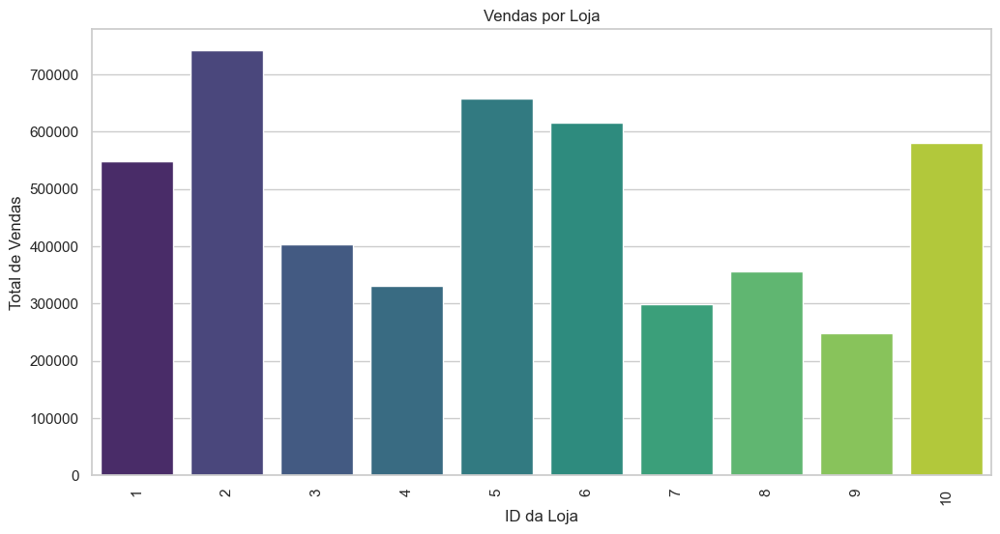

In [ ]:
# Agrupar os dados por loja e calcular a soma de vendas e estoque
df_loja = df.groupby("loja_id")[["venda", "estoque"]].sum().reset_index()

# Gráfico de barras de vendas por loja
plt.figure(figsize=(12, 6))
sns.barplot(x="loja_id", y="venda", data=df_loja, palette="viridis")
plt.title("Vendas por Loja")
plt.xlabel("ID da Loja")
plt.ylabel("Total de Vendas")
plt.xticks(rotation=90)
plt.show()


C:\Users\Rafae\AppData\Local\Temp\ipykernel_5876\1204518600.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="loja_id", y="estoque", data=df_loja, palette="viridis")


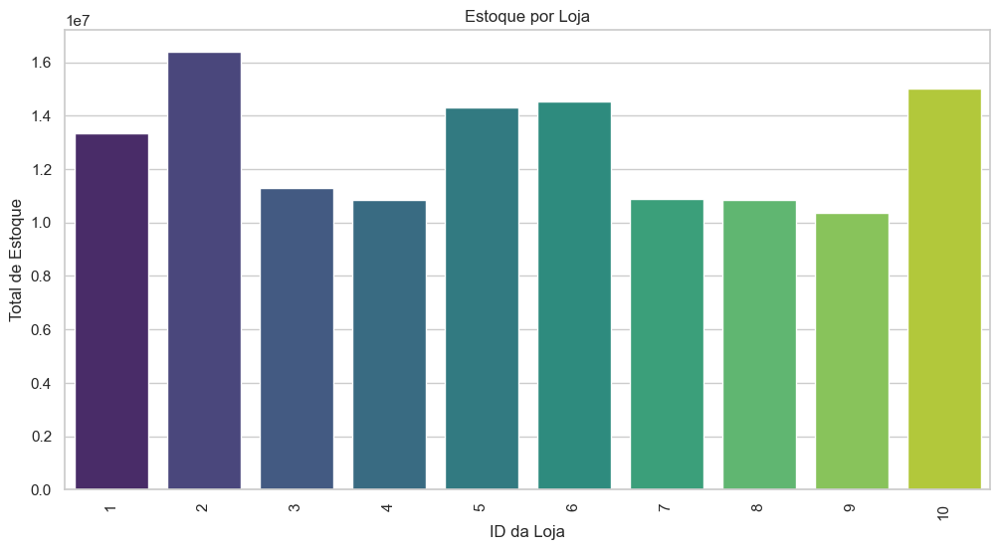

In [ ]:
# Gráfico de barras de estoque por loja
plt.figure(figsize=(12, 6))
sns.barplot(x="loja_id", y="estoque", data=df_loja, palette="viridis")
plt.title("Estoque por Loja")
plt.xlabel("ID da Loja")
plt.ylabel("Total de Estoque")
plt.xticks(rotation=90)
plt.show()

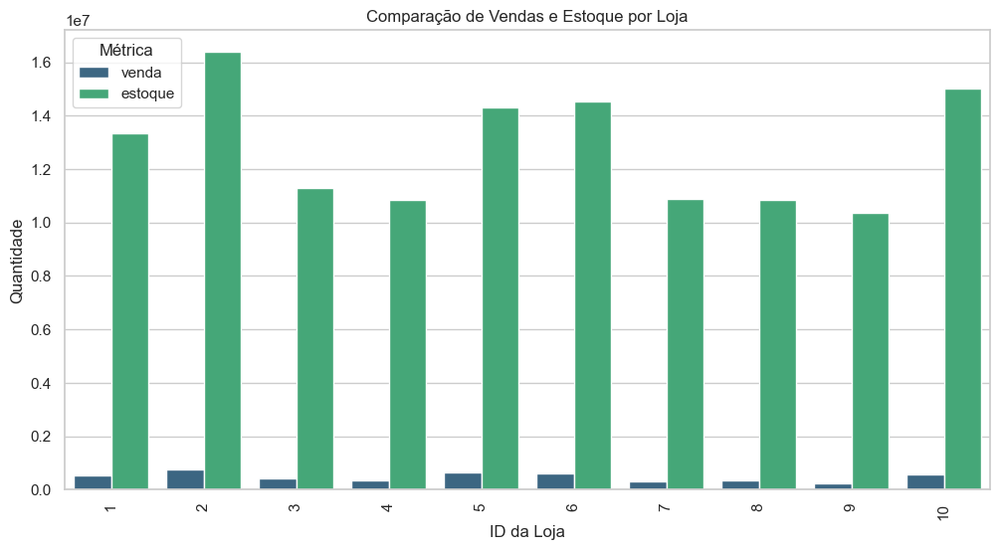

In [ ]:
# Agrupar os dados por loja e calcular a soma de vendas e estoque
df_loja = df.groupby("loja_id")[["venda", "estoque"]].sum().reset_index()

# Melt para formatação longa
df_loja_melt = df_loja.melt(id_vars='loja_id', value_vars=['venda', 'estoque'],
                            var_name='Métrica', value_name='Quantidade')

# Gráfico de barras agrupadas para lojas
plt.figure(figsize=(12, 6))
sns.barplot(x='loja_id', y='Quantidade', hue='Métrica', data=df_loja_melt, palette='viridis')
plt.title('Comparação de Vendas e Estoque por Loja')
plt.xlabel('ID da Loja')
plt.ylabel('Quantidade')
plt.xticks(rotation=90)
plt.legend(title='Métrica')
plt.show()

C:\Users\Rafae\AppData\Local\Temp\ipykernel_5876\3226766604.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="categoria_id", y="venda", data=df_categoria, palette="magma")


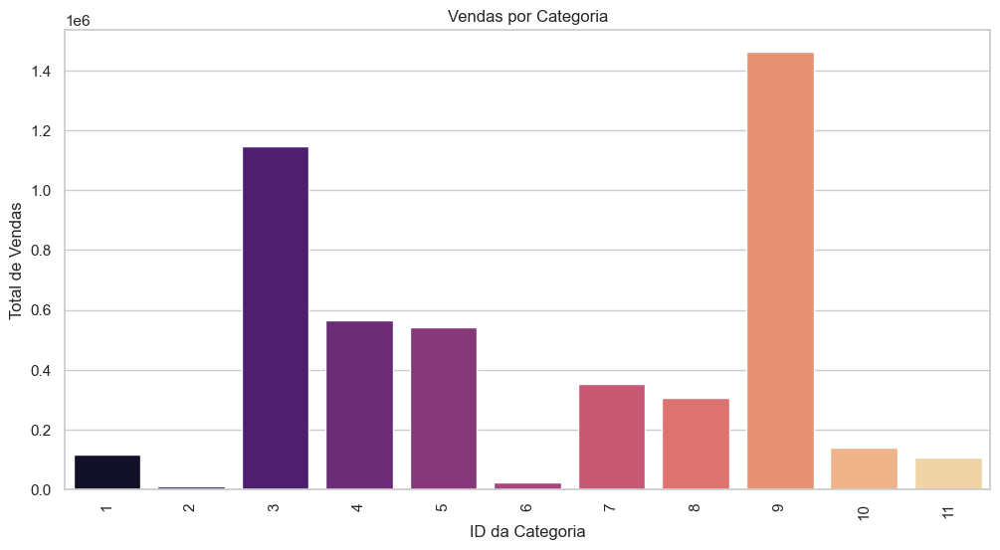

In [ ]:
# Agrupar os dados por categoria e calcular a soma de vendas e estoque
df_categoria = df.groupby("categoria_id")[["venda", "estoque"]].sum().reset_index()

# Gráfico de barras de vendas por categoria
plt.figure(figsize=(12, 6))
sns.barplot(x="categoria_id", y="venda", data=df_categoria, palette="magma")
plt.title("Vendas por Categoria")
plt.xlabel("ID da Categoria")
plt.ylabel("Total de Vendas")
plt.xticks(rotation=90)
plt.show()

C:\Users\Rafae\AppData\Local\Temp\ipykernel_5876\1685285672.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="categoria_id", y="estoque", data=df_categoria, palette="magma")


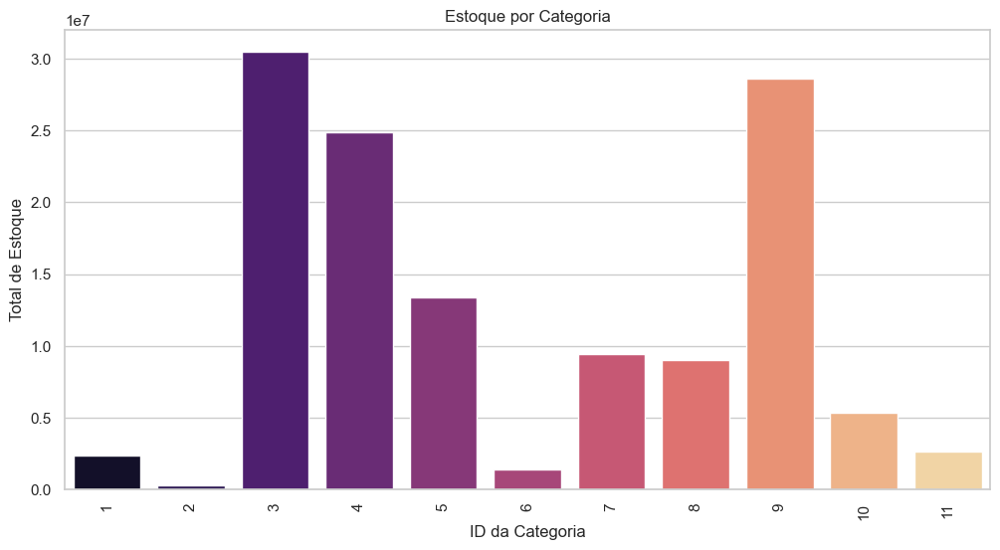

In [ ]:
# Gráfico de barras de estoque por categoria
plt.figure(figsize=(12, 6))
sns.barplot(x="categoria_id", y="estoque", data=df_categoria, palette="magma")
plt.title("Estoque por Categoria")
plt.xlabel("ID da Categoria")
plt.ylabel("Total de Estoque")
plt.xticks(rotation=90)
plt.show()

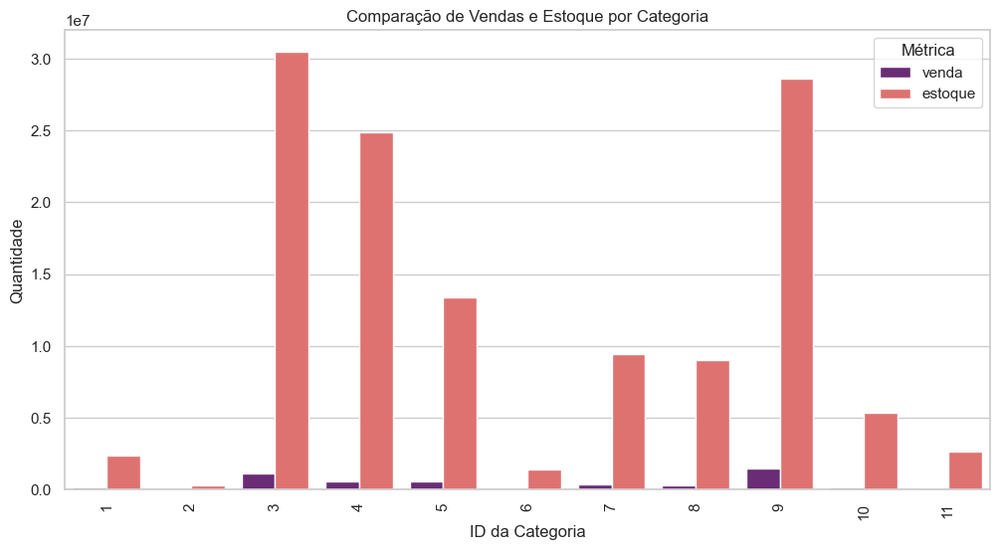

In [ ]:
# Agrupar os dados por loja e calcular a soma de vendas e estoque
df_categoria = df.groupby("categoria_id")[["venda", "estoque"]].sum().reset_index()

# Melt para formatação longa
df_categoria_melt = df_categoria.melt(id_vars='categoria_id', value_vars=['venda', 'estoque'],
                            var_name='Métrica', value_name='Quantidade')

# Gráfico de barras agrupadas para lojas
plt.figure(figsize=(12, 6))
sns.barplot(x='categoria_id', y='Quantidade', hue='Métrica', data=df_categoria_melt, palette='magma')
plt.title('Comparação de Vendas e Estoque por Categoria')
plt.xlabel('ID da Categoria')
plt.ylabel('Quantidade')
plt.xticks(rotation=90)
plt.legend(title='Métrica')
plt.show()

## Paretos

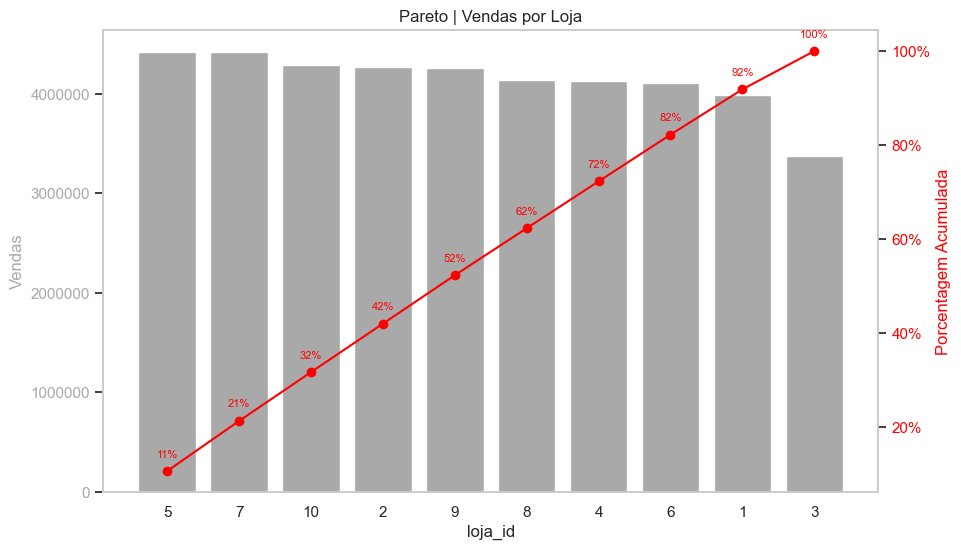

In [ ]:
y = "loja_id"
cor1 = "darkgray"
cor2 = "red"

# Dataframe com o id do produtos e a quantidade total de vendas
df_pareto = df[y].value_counts().reset_index()
df_pareto.columns = [y, "vendas"] # nomeando colunas

# Ordenando pela vendas
df_pareto.sort_values(by="vendas", ascending=False)

# Calculando a frequencia relativa das vendas
df_pareto["vendas_relativa"] = df_pareto["vendas"] / df_pareto["vendas"].sum()

# Calculando a frequencia acumulada das vendas
df_pareto["vendas_acumulada"] = df_pareto["vendas"].cumsum()

# Calculando a frequencia realtiva acumulada das vendas
df_pareto["vendas_relativa_acumulada"] = df_pareto["vendas_relativa"].cumsum()


# Gráfico
fig, ax1 = plt.subplots(figsize=(10, 6))

ax1.bar(df_pareto[y].astype(str), df_pareto["vendas"], color=cor1)
ax2 = ax1.twinx()
ax2.plot(df_pareto[y].astype(str), df_pareto["vendas_relativa_acumulada"], color=cor2, marker="o")


# Configurações
ax1.set_xlabel(y)
ax1.set_ylabel('Vendas', color=cor1)

ax1.tick_params(axis='y', labelcolor=cor1)
ax1.get_yaxis().get_major_formatter().set_scientific(False) # número bruto

ax2.set_ylabel('Porcentagem Acumulada', color=cor2)
ax2.tick_params(axis='y', labelcolor=cor2)
ax2.yaxis.set_major_formatter(mtick.PercentFormatter(1))

# # Valores sobre as barras
# ax1.bar_label(ax1.containers[0], color=cor1)

# Valores sobre a linha
for i, percentual in enumerate(df_pareto["vendas_relativa_acumulada"]):
    ax2.annotate(f"{percentual:.0%}", (i, percentual), textcoords="offset points", xytext=(0, 10), ha="center", color=cor2, fontsize = 8)

# Remover linhas de grade
ax1.grid(False)
ax2.grid(False)

plt.title('Pareto | Vendas por Loja')
plt.show()

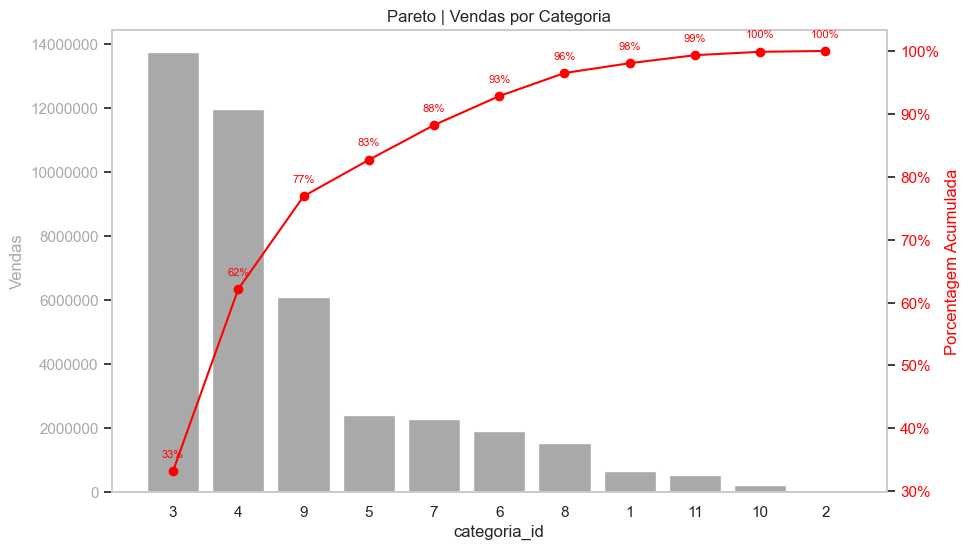

In [ ]:
y = "categoria_id"
cor1 = "darkgray"
cor2 = "red"

# Dataframe com o id do produtos e a quantidade total de vendas
df_pareto = df[y].value_counts().reset_index()
df_pareto.columns = [y, "vendas"] # nomeando colunas

# Ordenando pela vendas
df_pareto.sort_values(by="vendas", ascending=False)

# Calculando a frequencia relativa das vendas
df_pareto["vendas_relativa"] = df_pareto["vendas"] / df_pareto["vendas"].sum()

# Calculando a frequencia acumulada das vendas
df_pareto["vendas_acumulada"] = df_pareto["vendas"].cumsum()

# Calculando a frequencia realtiva acumulada das vendas
df_pareto["vendas_relativa_acumulada"] = df_pareto["vendas_relativa"].cumsum()


# Gráfico
fig, ax1 = plt.subplots(figsize=(10, 6))

ax1.bar(df_pareto[y].astype(str), df_pareto["vendas"], color=cor1)
ax2 = ax1.twinx()
ax2.plot(df_pareto[y].astype(str), df_pareto["vendas_relativa_acumulada"], color=cor2, marker="o")


# Configurações
ax1.set_xlabel(y)
ax1.set_ylabel('Vendas', color=cor1)

ax1.tick_params(axis='y', labelcolor=cor1)
ax1.get_yaxis().get_major_formatter().set_scientific(False) # número bruto

ax2.set_ylabel('Porcentagem Acumulada', color=cor2)
ax2.tick_params(axis='y', labelcolor=cor2)
ax2.yaxis.set_major_formatter(mtick.PercentFormatter(1))

# # Valores sobre as barras
# ax1.bar_label(ax1.containers[0], color=cor1)

# Valores sobre a linha
for i, percentual in enumerate(df_pareto["vendas_relativa_acumulada"]):
    ax2.annotate(f"{percentual:.0%}", (i, percentual), textcoords="offset points", xytext=(0, 10), ha="center", color=cor2, fontsize = 8)

# Remover linhas de grade
ax1.grid(False)
ax2.grid(False)

plt.title('Pareto | Vendas por Categoria')
plt.show()

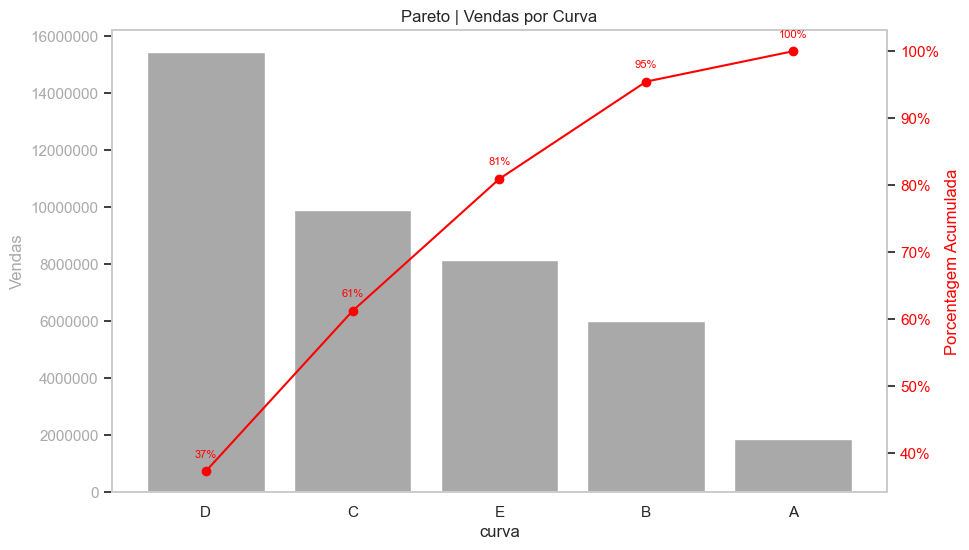

In [ ]:
y = "curva"
cor1 = "darkgray"
cor2 = "red"

# Dataframe com o id do produtos e a quantidade total de vendas
df_pareto = df[y].value_counts().reset_index()
df_pareto.columns = [y, "vendas"] # nomeando colunas

# Ordenando pela vendas
df_pareto.sort_values(by="vendas", ascending=False)

# Calculando a frequencia relativa das vendas
df_pareto["vendas_relativa"] = df_pareto["vendas"] / df_pareto["vendas"].sum()

# Calculando a frequencia acumulada das vendas
df_pareto["vendas_acumulada"] = df_pareto["vendas"].cumsum()

# Calculando a frequencia realtiva acumulada das vendas
df_pareto["vendas_relativa_acumulada"] = df_pareto["vendas_relativa"].cumsum()


# Gráfico
fig, ax1 = plt.subplots(figsize=(10, 6))

ax1.bar(df_pareto[y].astype(str), df_pareto["vendas"], color=cor1)
ax2 = ax1.twinx()
ax2.plot(df_pareto[y].astype(str), df_pareto["vendas_relativa_acumulada"], color=cor2, marker="o")


# Configurações
ax1.set_xlabel(y)
ax1.set_ylabel('Vendas', color=cor1)

ax1.tick_params(axis='y', labelcolor=cor1)
ax1.get_yaxis().get_major_formatter().set_scientific(False) # número bruto

ax2.set_ylabel('Porcentagem Acumulada', color=cor2)
ax2.tick_params(axis='y', labelcolor=cor2)
ax2.yaxis.set_major_formatter(mtick.PercentFormatter(1))

# # Valores sobre as barras
# ax1.bar_label(ax1.containers[0], color=cor1)

# Valores sobre a linha
for i, percentual in enumerate(df_pareto["vendas_relativa_acumulada"]):
    ax2.annotate(f"{percentual:.0%}", (i, percentual), textcoords="offset points", xytext=(0, 10), ha="center", color=cor2, fontsize = 8)

# Remover linhas de grade
ax1.grid(False)
ax2.grid(False)

plt.title('Pareto | Vendas por Curva')
plt.show()

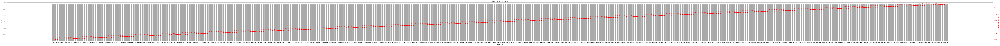

In [ ]:
y = "produto_id"
cor1 = "darkgray"
cor2 = "red"

# Dataframe com o id do produtos e a quantidade total de vendas
df_pareto = df[y].value_counts().reset_index()
df_pareto.columns = [y, "vendas"] # nomeando colunas

# Ordenando pela vendas
df_pareto.sort_values(by="vendas", ascending=False)

# Calculando a frequencia relativa das vendas
df_pareto["vendas_relativa"] = df_pareto["vendas"] / df_pareto["vendas"].sum()

# Calculando a frequencia acumulada das vendas
df_pareto["vendas_acumulada"] = df_pareto["vendas"].cumsum()

# Calculando a frequencia realtiva acumulada das vendas
df_pareto["vendas_relativa_acumulada"] = df_pareto["vendas_relativa"].cumsum()

############ Mudar qtd ############
qtd = 400
df_pareto1 = df_pareto[:qtd].copy()
# df_pareto1 = df_pareto
###################################

# Gráfico
fig, ax1 = plt.subplots(figsize=(150, 6))

ax1.bar(df_pareto1[y].astype(str), df_pareto1["vendas"], color=cor1)
ax2 = ax1.twinx()
ax2.plot(df_pareto1[y].astype(str), df_pareto1["vendas_relativa_acumulada"], color=cor2, marker="o")


# Configurações
ax1.set_xlabel(y)
ax1.set_ylabel('Vendas', color=cor1)

ax1.tick_params(axis='y', labelcolor=cor1)
ax1.get_yaxis().get_major_formatter().set_scientific(False) # número bruto

ax2.set_ylabel('Porcentagem Acumulada', color=cor2)
ax2.tick_params(axis='y', labelcolor=cor2)
ax2.yaxis.set_major_formatter(mtick.PercentFormatter(1))

# # Valores sobre as barras
# ax1.bar_label(ax1.containers[0], color=cor1)

# Valores sobre a linha
for i, percentual in enumerate(df_pareto1["vendas_relativa_acumulada"]):
    ax2.annotate(f"{percentual:.0%}", (i, percentual), textcoords="offset points", xytext=(0, 10), ha="center", color=cor2, fontsize = 8)

# Remover linhas de grade
ax1.grid(False)
ax2.grid(False)

plt.title('Pareto | Vendas por Produto')
plt.show()

## Séries de Vendas ao Longo do Tempo

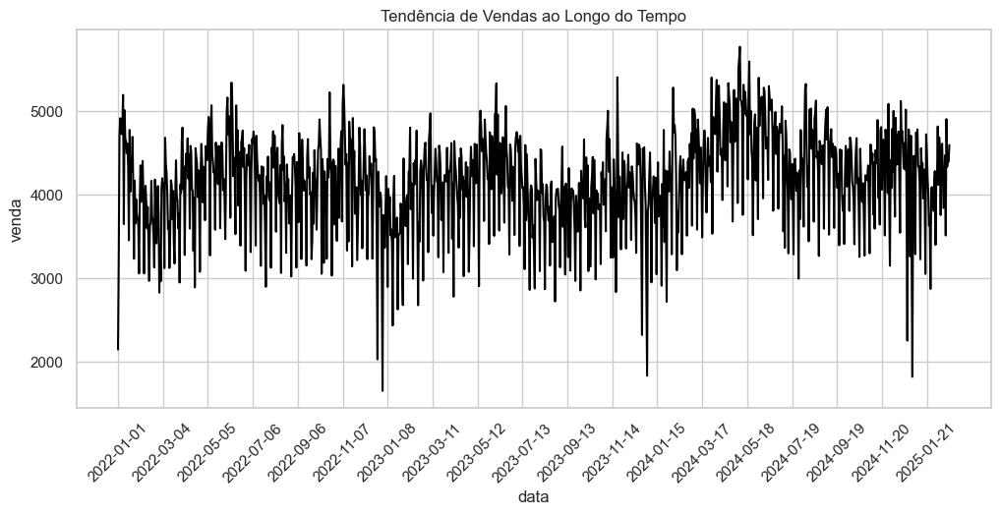

In [ ]:
# Tendência de Vendas ao Longo do Tempo
df_time = df.groupby("data")["venda"].sum().reset_index()
plt.figure(figsize=(12, 5))
sns.lineplot(x="data", y="venda", data=df_time, color="black")

# Mostrar apenas alguns labels no eixo X
indices = np.arange(0, len(df_time["data"]), step=62)
plt.xticks(indices, df_time["data"].iloc[indices], rotation=45)

plt.title("Tendência de Vendas ao Longo do Tempo")
plt.show()

### Tendência de Vendas e Estoque

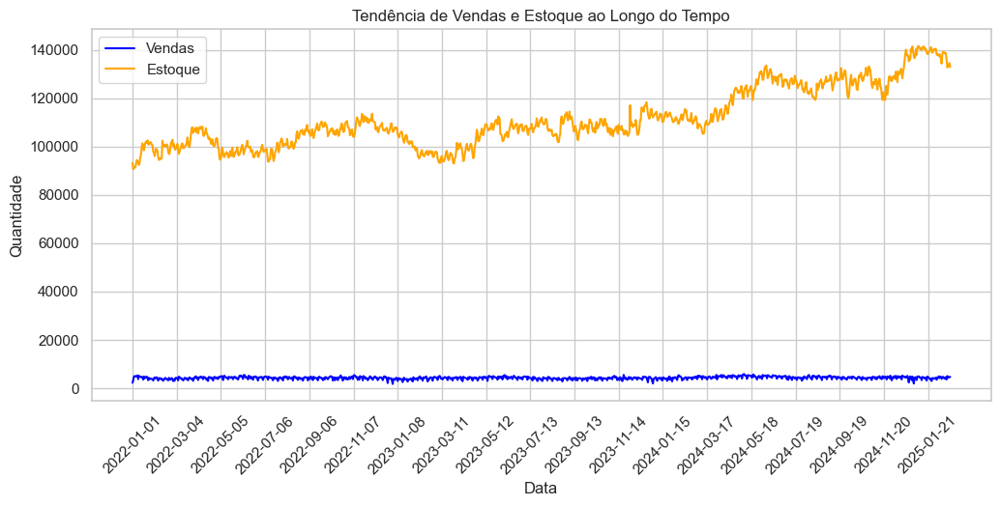

In [ ]:
# Agrupar os dados por data e calcular a soma de vendas e estoque
df_time = df.groupby("data")[["venda", "estoque"]].sum().reset_index()

# Plotar as tendências de vendas e estoque ao longo do tempo
plt.figure(figsize=(12, 5))
sns.lineplot(x="data", y="venda", data=df_time, color="blue", label="Vendas")
sns.lineplot(x="data", y="estoque", data=df_time, color="orange", label="Estoque")

# Mostrar apenas alguns labels no eixo X
indices = np.arange(0, len(df_time["data"]), step=62)
plt.xticks(indices, df_time["data"].iloc[indices], rotation=45)

plt.title("Tendência de Vendas e Estoque ao Longo do Tempo")
plt.xlabel("Data")
plt.ylabel("Quantidade")
plt.legend()
plt.show()

### Vendas agrupado por "Medicamento"

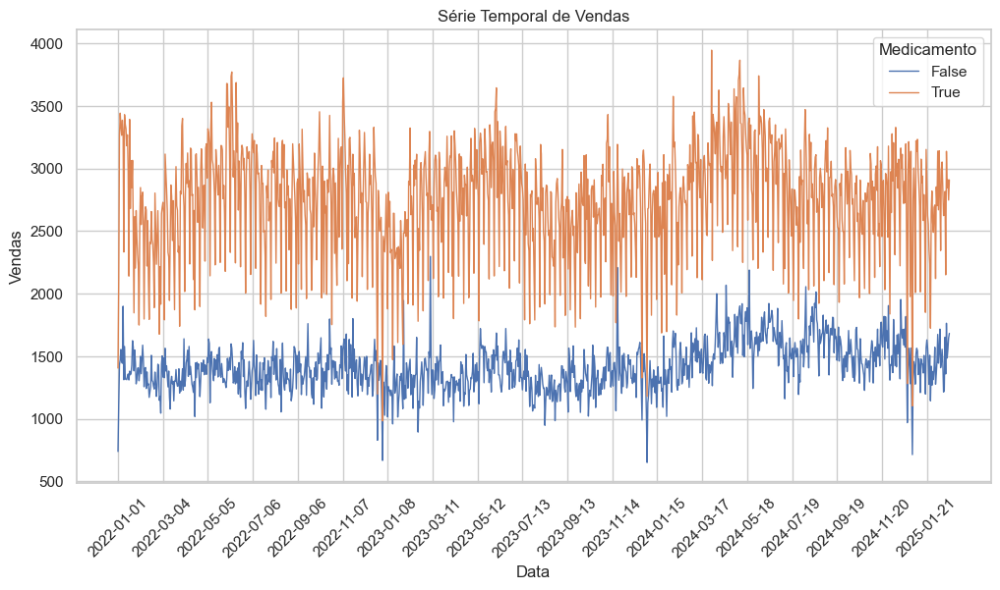

In [ ]:
# Categorias únicas da variável categórica Y
Y = 'is_medicamento'
categorias = df[Y].unique()

# Tamanho do gráfico
plt.figure(figsize=(12, 6))

# Criar série temporal para cada categoria de Y
for categoria in categorias:

    df_categoria = df[df[Y] == categoria].groupby("data")[["venda"]].sum().reset_index()
    sns.lineplot(x="data", y="venda", data=df_categoria, label=f"{categoria}", linewidth=1)

# Mostrar apenas alguns labels no eixo X
indices = np.arange(0, len(df_categoria["data"]), step=62)
plt.xticks(indices, df_categoria["data"].iloc[indices], rotation=45)

plt.title("Série Temporal de Vendas")
plt.xlabel("Data")
plt.ylabel("Vendas")
plt.legend(title = "Medicamento")
plt.show()

### Vendas agrupado por "Curva"

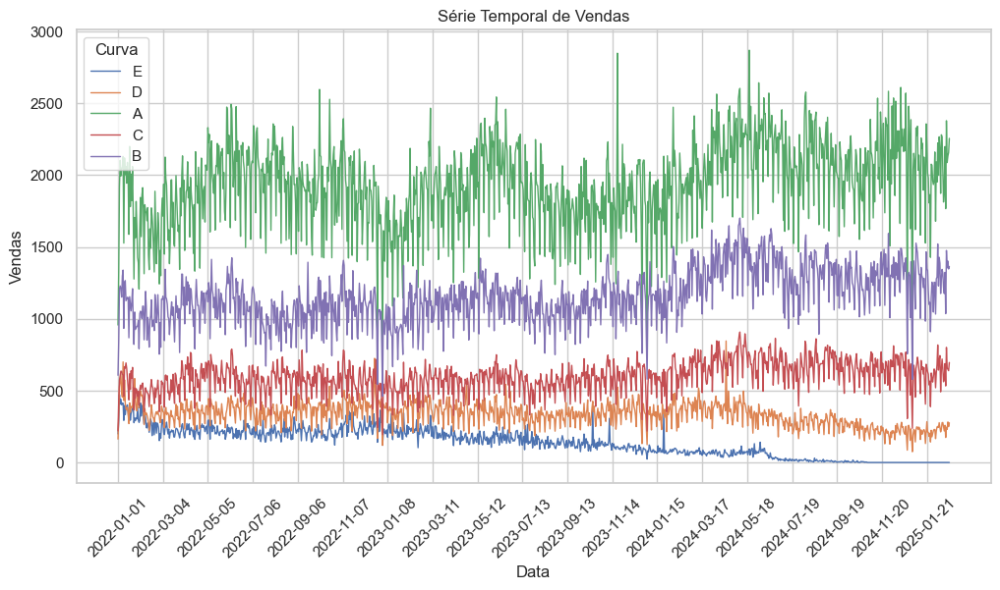

In [ ]:
# Categorias únicas da variável categórica Y
Y = 'curva'
categorias = df[Y].unique()

# Tamanho do gráfico
plt.figure(figsize=(12, 6))

# Criar série temporal para cada categoria de Y
for categoria in categorias:

    df_categoria = df[df[Y] == categoria].groupby("data")[["venda"]].sum().reset_index()
    sns.lineplot(x="data", y="venda", data=df_categoria, label=f"{categoria}", linewidth=1)

# Mostrar apenas alguns labels no eixo X
indices = np.arange(0, len(df_categoria["data"]), step=62)
plt.xticks(indices, df_categoria["data"].iloc[indices], rotation=45)

plt.title("Série Temporal de Vendas")
plt.xlabel("Data")
plt.ylabel("Vendas")
plt.legend(title = "Curva")
plt.show()

### Vendas segregado por "Curva" e "Medicamento"

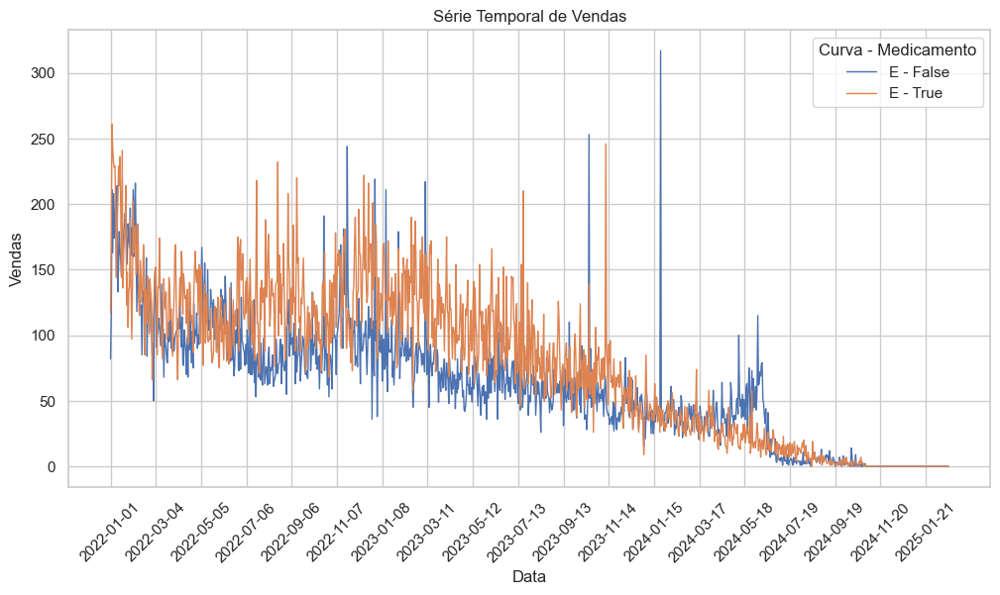

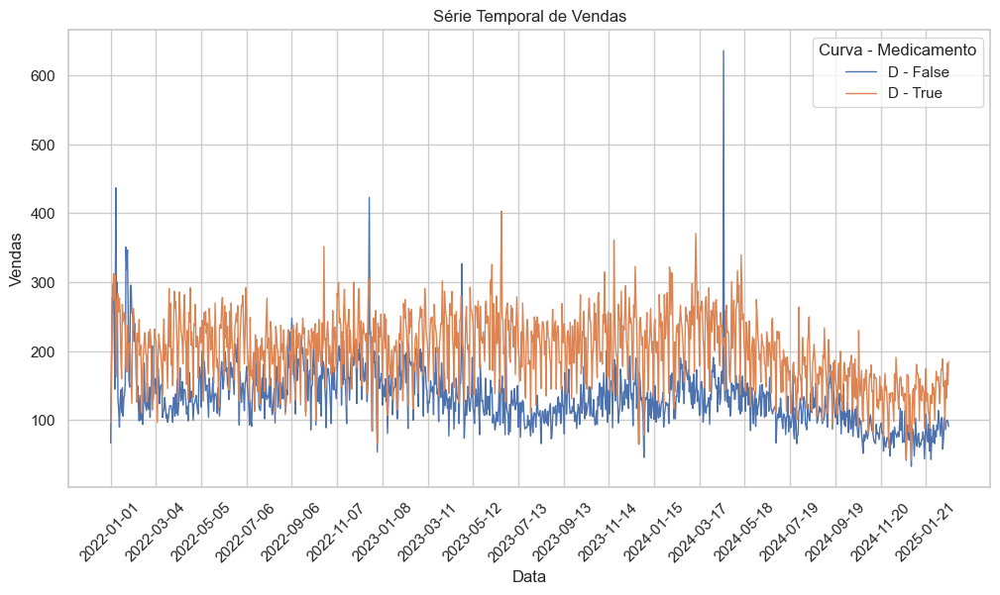

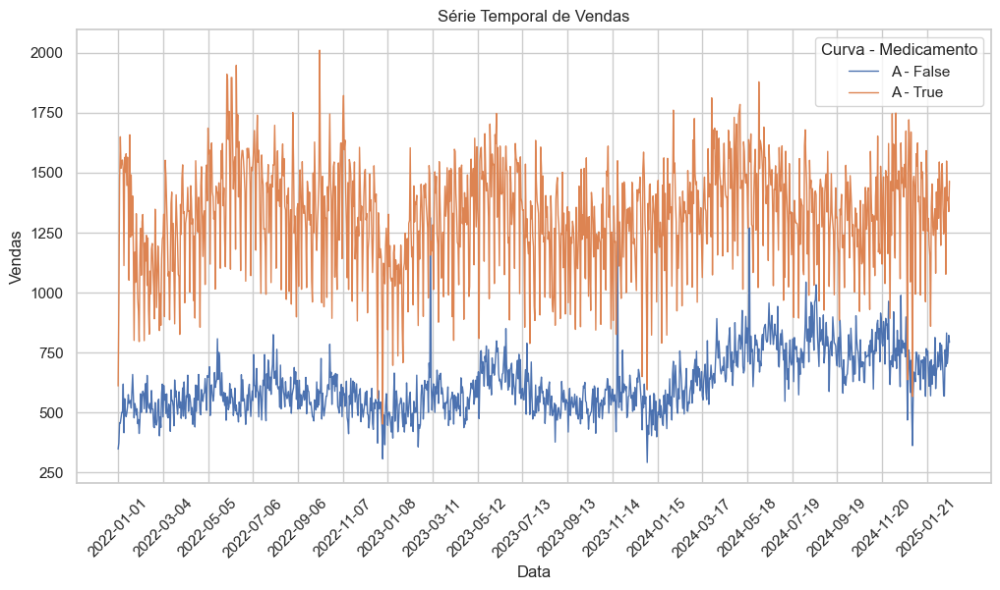

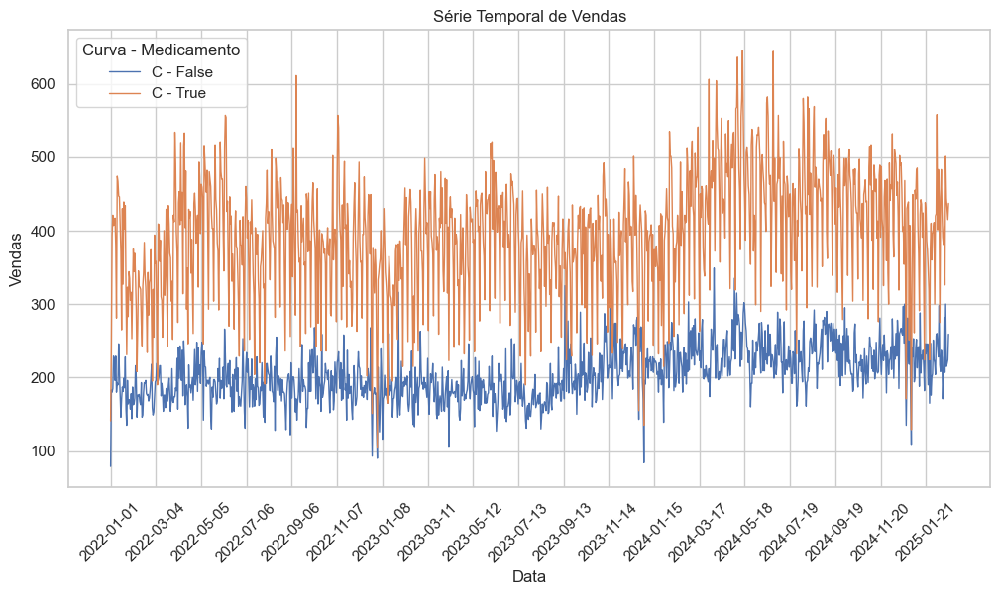

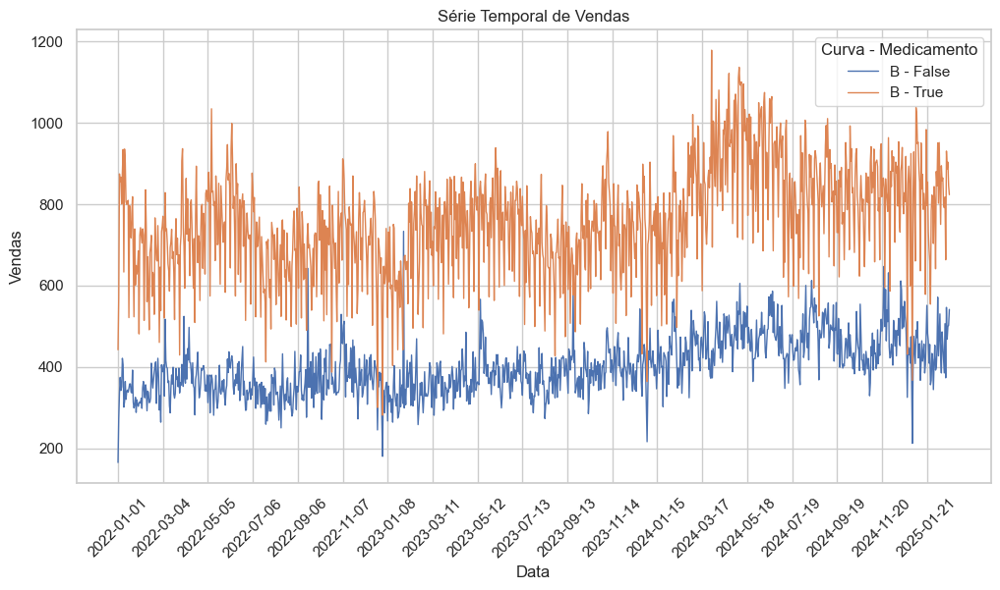

In [ ]:
# Categorias únicas da variável categórica Y
Y = "curva"
Y2 = "is_medicamento"

# Criar série temporal para cada categoria de Y, segmentando por is_medicamento

for categoria in df[Y].unique():

    # Tamanho do gráfico
    plt.figure(figsize=(12, 6))

    for categoria2 in df[Y2].unique():
        df_categoria = df[(df[Y] == categoria) & (df[Y2] == categoria2)].groupby("data")[["venda"]].sum().reset_index()
        sns.lineplot(x="data", y="venda", data=df_categoria, label=f"{categoria} - {categoria2}", linewidth=1)

    # Mostrar apenas alguns labels no eixo X
    indices = np.arange(0, len(df_categoria["data"]), step=62)
    plt.xticks(indices, df_categoria["data"].iloc[indices], rotation=45)

    plt.title("Série Temporal de Vendas")
    plt.xlabel("Data")
    plt.ylabel("Vendas")
    plt.legend(title = "Curva - Medicamento")
    plt.show()

### Vendas agrupado por "Loja"

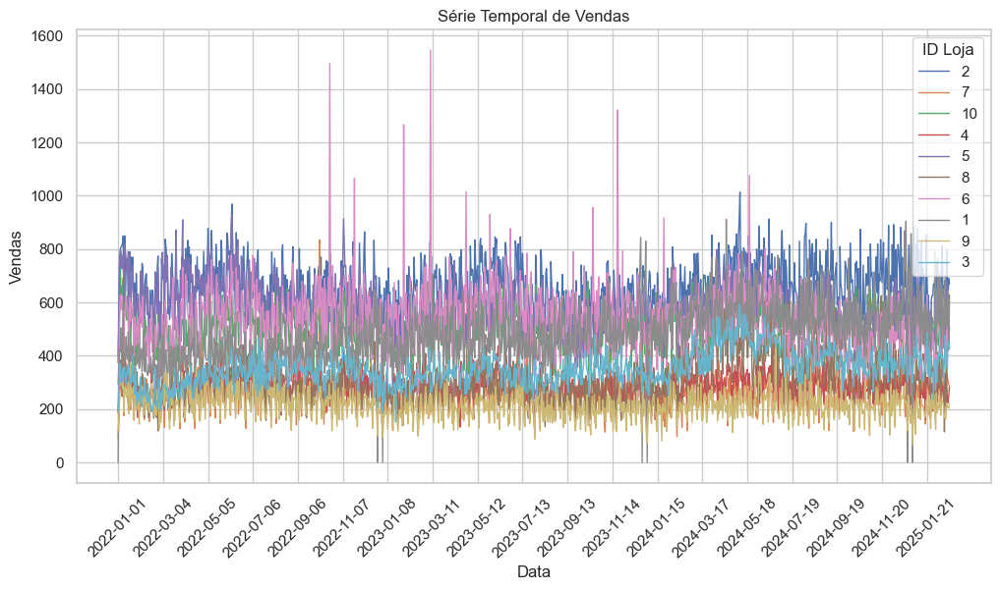

In [ ]:
# Categorias únicas da variável categórica Y
Y = 'loja_id'
categorias = df[Y].unique()

# Tamanho do gráfico
plt.figure(figsize=(12, 6))

# Criar série temporal para cada categoria de Y
for categoria in categorias:

    df_categoria = df[df[Y] == categoria].groupby("data")[["venda"]].sum().reset_index()
    sns.lineplot(x="data", y="venda", data=df_categoria, label=f"{categoria}", linewidth=1)

# Mostrar apenas alguns labels no eixo X
indices = np.arange(0, len(df_categoria["data"]), step=62)
plt.xticks(indices, df_categoria["data"].iloc[indices], rotation=45)

plt.title("Série Temporal de Vendas")
plt.xlabel("Data")
plt.ylabel("Vendas")
plt.legend(title = "ID Loja")
plt.show()

### Vendas agrupado por "Categoria"

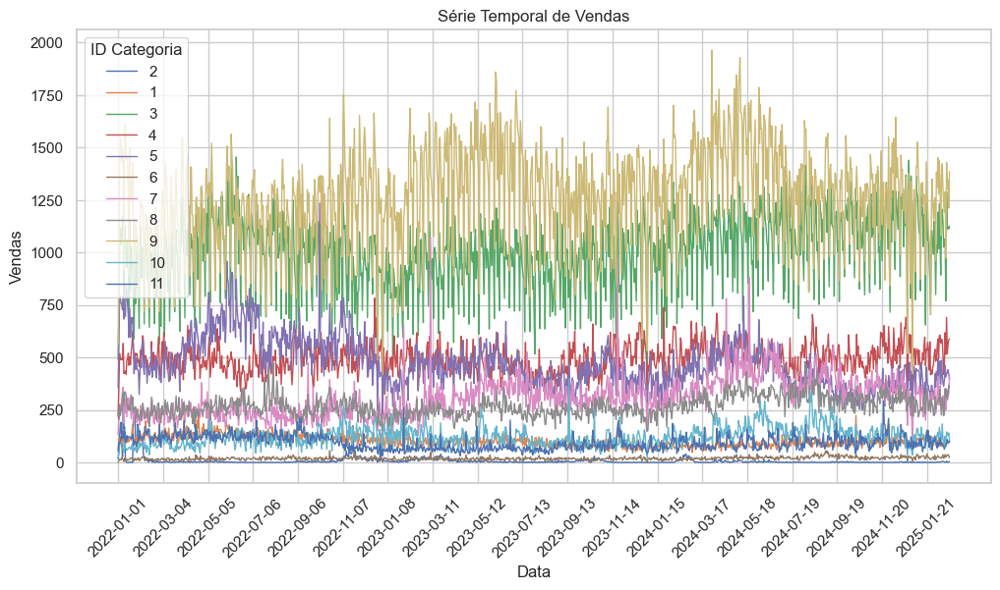

In [ ]:
# Categorias únicas da variável categórica Y
Y = 'categoria_id'
categorias = df[Y].unique()

# Tamanho do gráfico
plt.figure(figsize=(12, 6))

# Criar série temporal para cada categoria de Y
for categoria in categorias:

    df_categoria = df[df[Y] == categoria].groupby("data")[["venda"]].sum().reset_index()
    sns.lineplot(x="data", y="venda", data=df_categoria, label=f"{categoria}", linewidth=1)

# Mostrar apenas alguns labels no eixo X
indices = np.arange(0, len(df_categoria["data"]), step=62)
plt.xticks(indices, df_categoria["data"].iloc[indices], rotation=45)

plt.title("Série Temporal de Vendas")
plt.xlabel("Data")
plt.ylabel("Vendas")
plt.legend(title = "ID Categoria")
plt.show()

## Heatmaps - Volume de Vendas por Produto

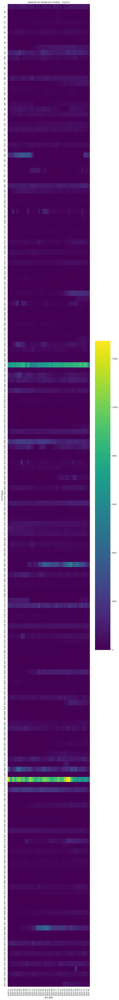

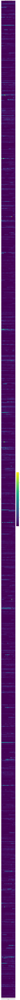

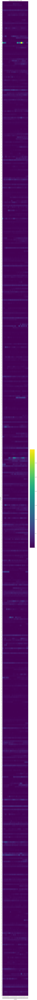

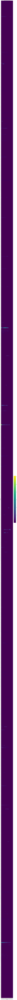

In [ ]:
# Convertendo a coluna de data para datetime
df_heatmap0 = df.copy()
df_heatmap0["data"] = pd.to_datetime(df_heatmap0["data"])

# Criando a coluna de ano-mês
df_heatmap0["ano_mes"] = df_heatmap0["data"].dt.to_period("M").astype(str)

# Agrupando por ano-mês, produto e curva, somando a quantidade total de vendas
df_heatmap = df_heatmap0.groupby(["produto_id", "ano_mes", "curva"])["venda"].sum().reset_index()

# Criar um heatmap para cada curva
for categoria in df_heatmap["curva"].unique():

    df_heatmap_aux = df_heatmap[df_heatmap["curva"] == categoria]
    df_pivot = df_heatmap_aux.pivot(index="produto_id", columns="ano_mes", values="venda").fillna(0)

    # Criando o heatmap
    plt.figure(figsize=(10, (df_pivot.shape[0])/2))
    sns.heatmap(df_pivot, cmap="viridis", linewidths=0)

    # Ajustando rótulos
    plt.xlabel("Ano-Mês")
    plt.ylabel("ID Produto")
    plt.title(f"Heatmap de Vendas por Produto - Curva {categoria}")

    plt.show()